---
<h1><B> Deep Learning (AI2100/AI5100)  </h1></B></center>

---

<table>
<tr> 
<td><h3> Assignment : </td>
<td><h3> 3 </td>
</tr>
<tr> 
<td><h3> Name : </td>
<td><h3> Manan Darji </td>
</tr>
<tr> 
<td><h3> Roll Number : </td>
<td> <h3>CS22MTECH14004 </td>
</tr>
<table>

---

# Que 1


1. Variants of Backprop for visualizing CNNs Download a ResNet-50 trained on the ILSVRC classification task and 5 images from here. Considering the neuron corresponding to the highest predicted score in the output layer, implement and visualize the results for...

* (a) Vanilla Backpropagation (you may use the builtin implementation) (2)

* (b) Guided-back-propagation (3) (you may use the builtin grad function for computing gradient of a node with other in the computational graph)

* (c) Class Activatoin Map (CAM) (4)

* (d) Guided Grad-CAM (6)

* Clear visualization of these results for the chosen 5 images carries 5 marks.

In [117]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
import torch
from torchvision import models, transforms
from torch.nn import functional
from torch import topk
import warnings 
warnings.filterwarnings('ignore')

plt.style.use('seaborn')

In [118]:
# Here I am creating Dir to store the images
# Put Images i1.jpg - i5.jpg here
!mkdir Test

mkdir: cannot create directory ‘Test’: File exists


In [119]:
def ShowImage(img1,img2,CLR_BAR = True,gray = False,title="Image",Label1 = "Input",Label2 = "Output",Iw = 14,Ih = 7):
  """
  This is just a simple function to Show 2 Images Side by side using MatplotLib.
  """
  fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(Iw,Ih))
  fig.suptitle(title,fontsize = 15)
  ax1.imshow(img1)
  ax1.set_title(Label1)
  ax1.grid()
  
  if gray:
    ax2.imshow(img2 ,cmap='gray')
  else:
    ax2.imshow(img2)

  ax2.set_title(Label2)
  ax2.grid()

  # Disabling Axis just cuz' not needed 
  ax1.axes.get_xaxis().set_visible(False)
  ax1.axes.get_yaxis().set_visible(False)
  ax2.axes.get_xaxis().set_visible(False)
  ax2.axes.get_yaxis().set_visible(False)

  plt.grid()
  plt.show()


In [120]:
FileList = [
    "/content/Test/i1.jpg",
    "/content/Test/i2.jpg",
    "/content/Test/i3.jpg",
    "/content/Test/i4.jpg",
    "/content/Test/i5.jpg",
    ]

In [121]:
# Loading pretrained model from pytorch 
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
model.eval()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [122]:
# Geeting names of 1000 classes 
# Reference : pytorch documentation
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

# Geeting labels from downloded files
with open("imagenet_classes.txt", "r") as f:
  categories = [s.strip() for s in f.readlines()]

--2023-03-18 10:54:56--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt.3’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0s      

2023-03-18 10:54:56 (79.7 MB/s) - ‘imagenet_classes.txt.3’ saved [10472/10472]



In [123]:
def ReadImg(filename):
  """
    Just reading an Image.
  """
  return Image.open(filename)
  
def TransforImg(img):
  """
    transforming an Image as per resnet requirments.
    Reference : pytorch documentation
  """
  preprocess = transforms.Compose([
      transforms.Resize(256),
      transforms.CenterCrop(224),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  return preprocess(img).unsqueeze(0)

In [124]:
Golbal_Image_Save = []

## (a) Vanilla Backpropagation (you may use the builtin implementation) (2)

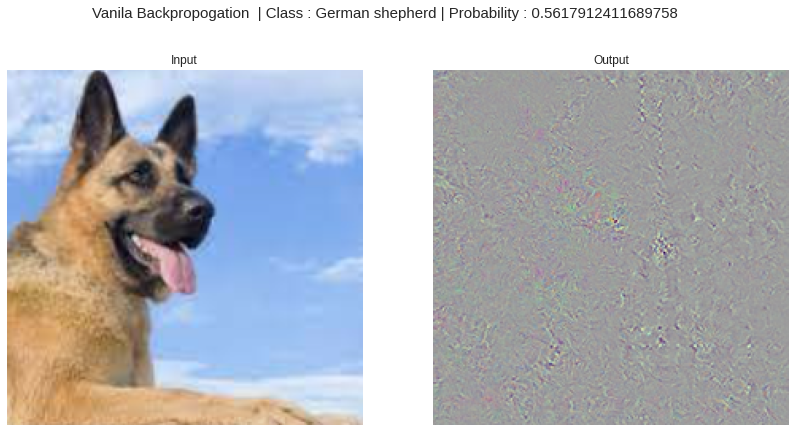

____________________________________________________________________________________________________


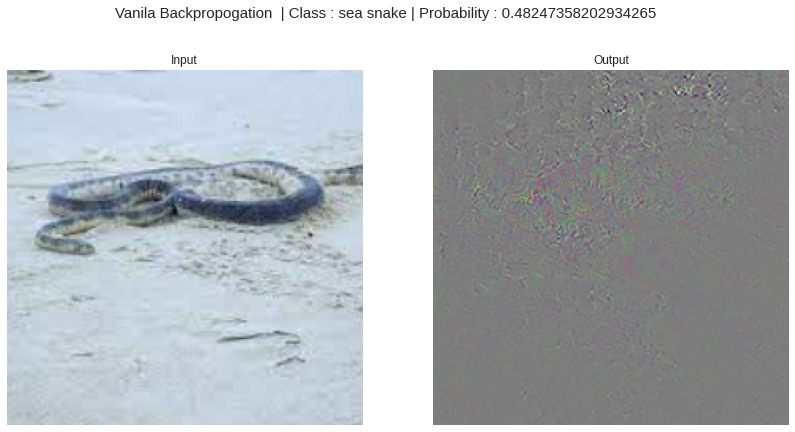

____________________________________________________________________________________________________


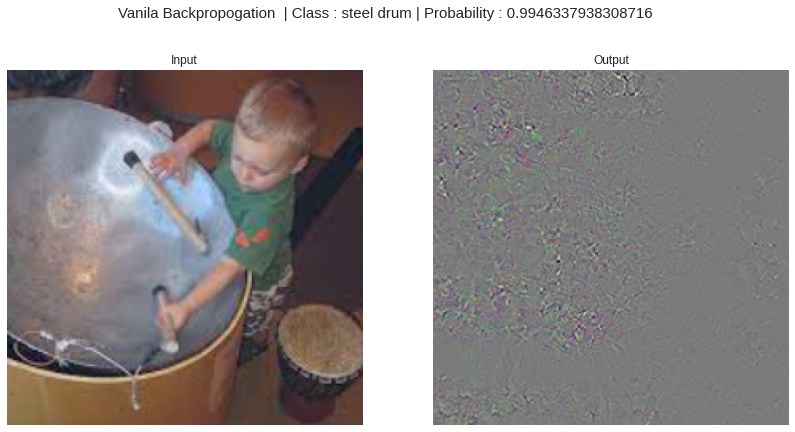

____________________________________________________________________________________________________


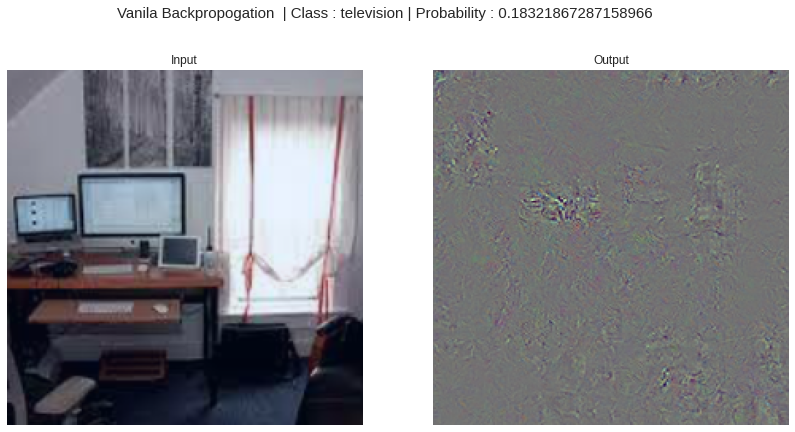

____________________________________________________________________________________________________


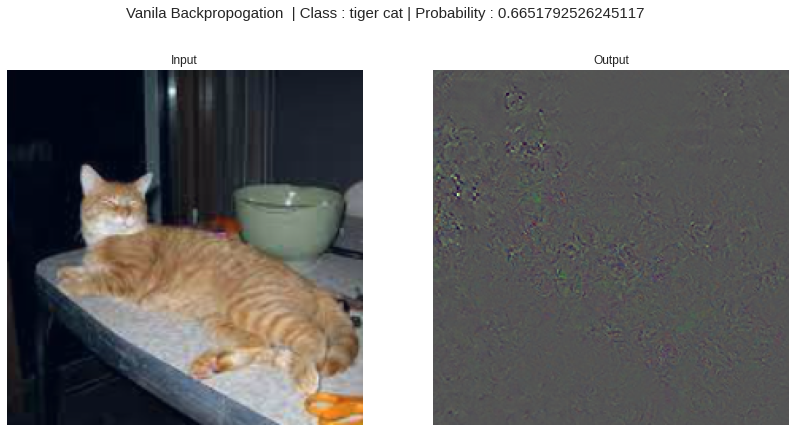

____________________________________________________________________________________________________


In [125]:
Local_Image_Save = []
Local_Image_SaveT = []
# Iterating over all the files
for filename in FileList:
  # Loading Image
  img = ReadImg(filename)
  # Transforming Image
  T_img = TransforImg(img)

  # for backprop enabling the gradients
  T_img.requires_grad = True

  # Forward pass
  out = model(T_img)

  # Geeting prediction class
  predClass = torch.argmax(out).item()

  # setting grad = 0
  model.zero_grad() 

  # Backward pass respect to pred class
  out[0, predClass].backward()

  # geeting grad
  grad = T_img.grad[0].numpy()

  # normalizing grad 
  grad = (grad - grad.min()) / (grad.max() - grad.min())

  # disabling req_grad to show image
  T_img.requires_grad = False 


  # Just getting top class label
  Title = "Vanila Backpropogation "
  prob = torch.nn.functional.softmax(out[0],-1)
  top5_prob, top5_catid = torch.topk(prob, 1)
  for i in range(top5_prob.size(0)):
    Title += " | Class : "+ str(categories[top5_catid[i]]) + " | Probability : " +  str(top5_prob[i].item())

  # Modifying image channels to show image
  T_img = np.transpose(T_img[0], (1, 2, 0))
  T_img = (T_img - T_img.min()) / (T_img.max() - T_img.min()) # Just to plot without warning 
  Grad_img = np.transpose(grad, (1, 2, 0))
  Grad_img = (Grad_img - Grad_img.min()) / (Grad_img.max() - Grad_img.min())

  # Showing Image
  ShowImage(T_img, Grad_img, title = Title)

  # Saving Images to Show in end grid  
  Local_Image_SaveT.append(T_img)
  Local_Image_Save.append(Grad_img)
  print("_"*100)
Golbal_Image_Save.append(Local_Image_SaveT)
Golbal_Image_Save.append(Local_Image_Save)
  

## (b) Guided-back-propagation (3) (you may use the builtin grad function for computing gradient of a node with other in the computational graph)


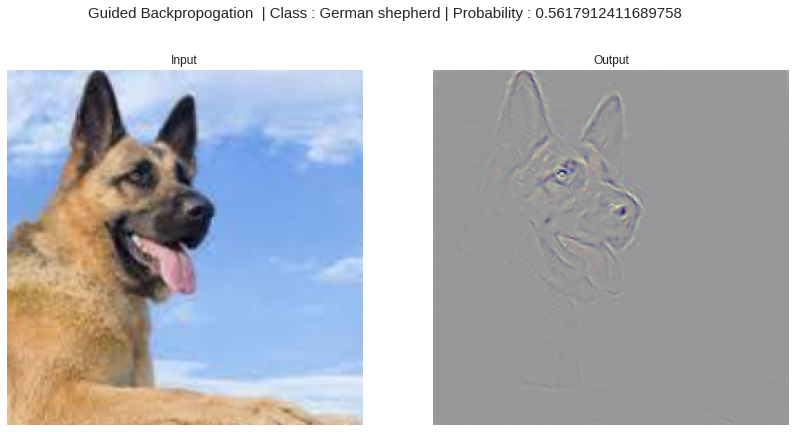

____________________________________________________________________________________________________


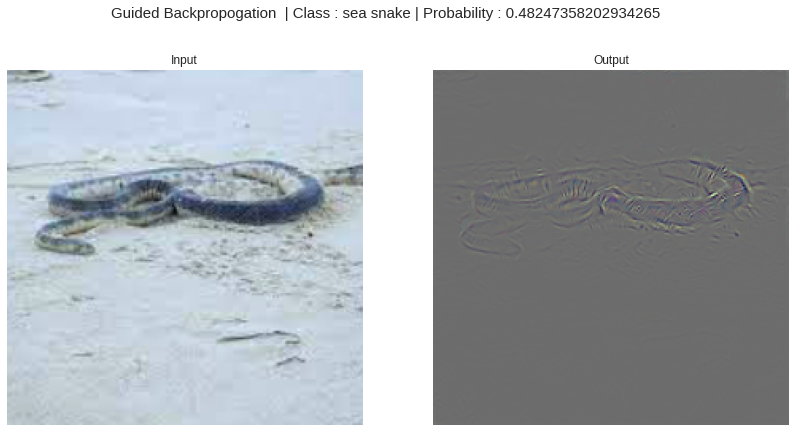

____________________________________________________________________________________________________


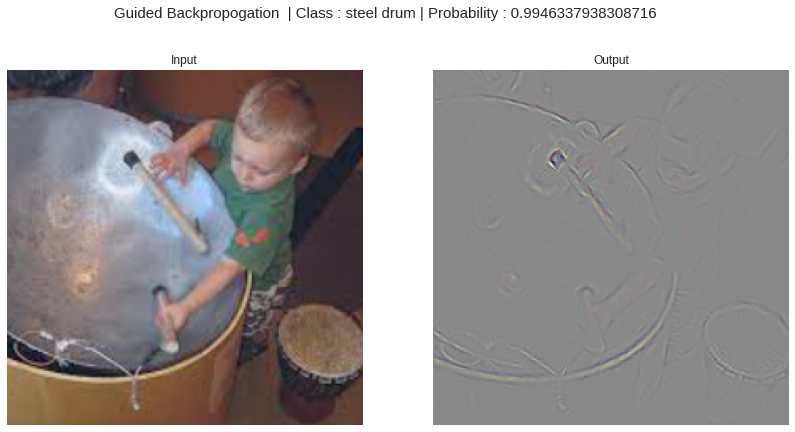

____________________________________________________________________________________________________


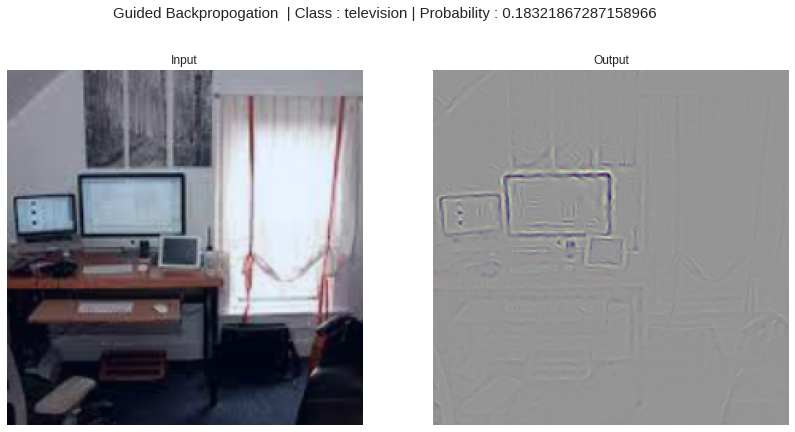

____________________________________________________________________________________________________


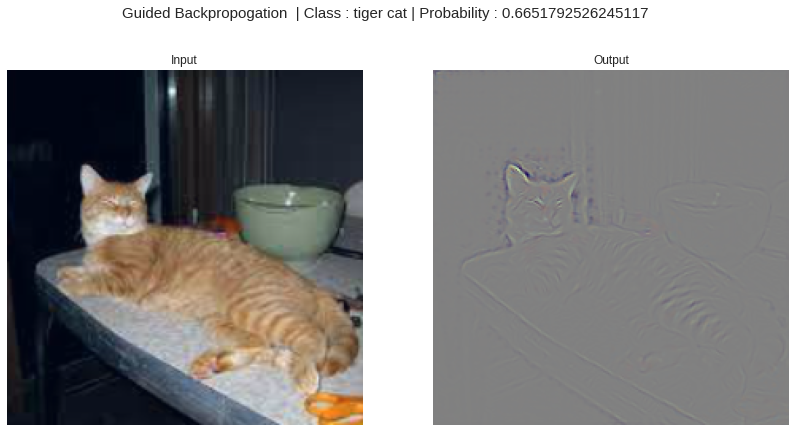

____________________________________________________________________________________________________


In [126]:
# This is a Relu Hook for guided back prop
def Layer4_Relu_hook(module, grad_in, grad_out):
  return(torch.clamp(grad_in[0],min=0.),)

# registering all relu for relu hook
for i, module in enumerate(model.modules()):
    if isinstance(module, torch.nn.ReLU):
        module.register_backward_hook(Layer4_Relu_hook)


Local_Image_Save = []
# Iterating over all the files
for filename in FileList:
  # Loading the image 
  img = ReadImg(filename)

  # transforming the image
  T_img = TransforImg(img)

  T_img.requires_grad = True 

  # Forward pass
  output = model(T_img)

  # Geeting top class
  pred_class = torch.argmax(output)

  # Backward pass
  output[0,pred_class].backward()

  # Just getting top class label
  Title = "Guided Backpropogation "
  prob = torch.nn.functional.softmax(output[0],-1)
  top5_prob, top5_catid = torch.topk(prob, 1)
  for i in range(top5_prob.size(0)):
    Title += " | Class : "+ str(categories[top5_catid[i]]) + " | Probability : " +  str(top5_prob[i].item())


  Grad_img = T_img.grad.squeeze(0)

  # Normalizing image to show
  Grad_img = (Grad_img - Grad_img.min()) / (Grad_img.max() - Grad_img.min())
  Grad_img = Grad_img.permute(1,2,0)

  T_img.requires_grad = False
  T_img = (T_img - T_img.min()) / (T_img.max() - T_img.min())
  T_img = np.transpose(T_img[0], (1, 2, 0))

  # Show Image
  ShowImage(T_img, Grad_img,title = Title)

  # Saving Images to Show in end grid
  Local_Image_Save.append(Grad_img)
  print("_"*100)
Golbal_Image_Save.append(Local_Image_Save)

## (c) Class Activatoin Map (CAM) (4)


In [127]:
def TransforImgCam(img):
  preprocess = transforms.Compose([
      transforms.Resize(288),
      transforms.CenterCrop(288),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  return preprocess(img).unsqueeze(0)

In [128]:
def Get_Class_Activatoin_Map(Extracted_Feature_Maps, weights, idx):
  """
  This Function Generates the Class_Activatoin_Map
  """
  # Input Image size
  Inp_Size = (288, 288)

  # Get No of channels, Height and width
  _, c, h, w = Extracted_Feature_Maps.shape

  # here we do multiplicatin(dot product) with selected index weight(target class) and extracted feature maps.
  # we reshape it to orighnal feature size
  ClassActiMap = weights[idx].dot(Extracted_Feature_Maps.reshape((c, h*w))).reshape(h, w)

  # Here we do normaliztion
  ClassActiMap = ((ClassActiMap - ClassActiMap.min()) / (ClassActiMap.max() - ClassActiMap.min())) * 255

  # Here we return resized Class Activatoin Map
  return cv2.resize(np.uint8(ClassActiMap), Inp_Size)


def Get_Merged_Cam(CAM, width, height, Inp_Image, idx):
  # Using Opencv we find out the Heatmap from our cam image
  img = cv2.resize(CAM,(width, height))
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  HeatMap = cv2.applyColorMap(img, cv2.COLORMAP_PLASMA  )
  HeatMap = cv2.cvtColor(HeatMap, cv2.COLOR_BGR2RGB)

  # We merged that heatmap with the orignal image with 50% opacity of both
  Merged_Image = HeatMap * 0.5 + Inp_Image * 0.5

  # we return normailed image
  return Merged_Image/255.0



Extracted_Feature_Maps = []
def Layer4_hook(module, input, output):
  """
    This function is used to get convolutions at last layer and store them into list 
  """
  Extracted_Feature_Maps.append(output.data.cpu().numpy())


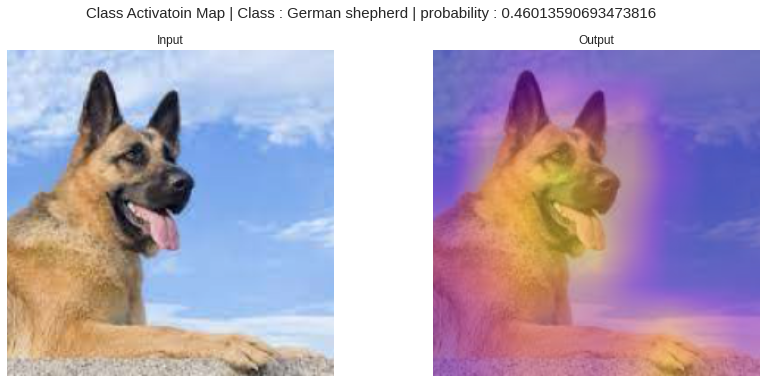

____________________________________________________________________________________________________


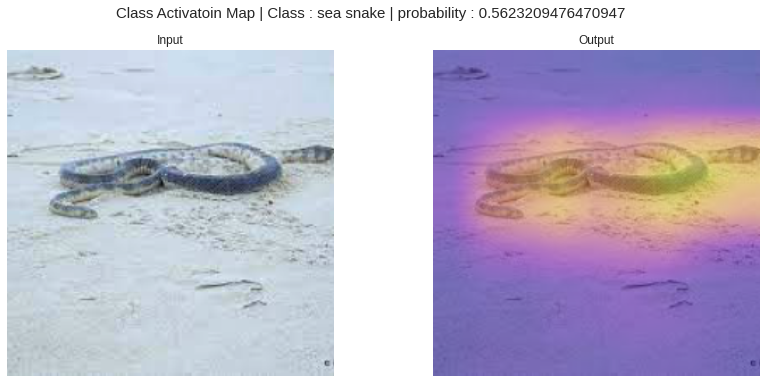

____________________________________________________________________________________________________


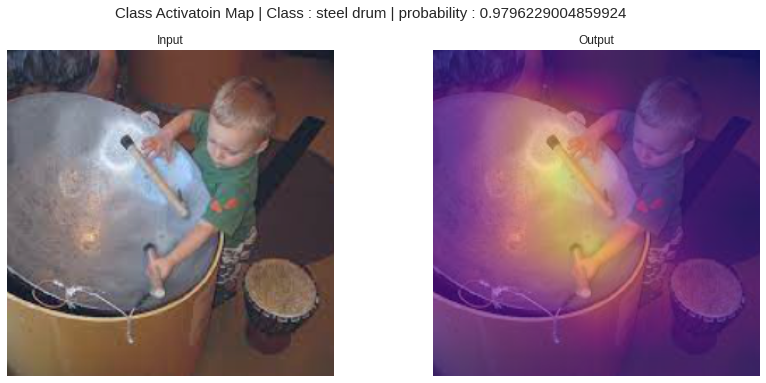

____________________________________________________________________________________________________


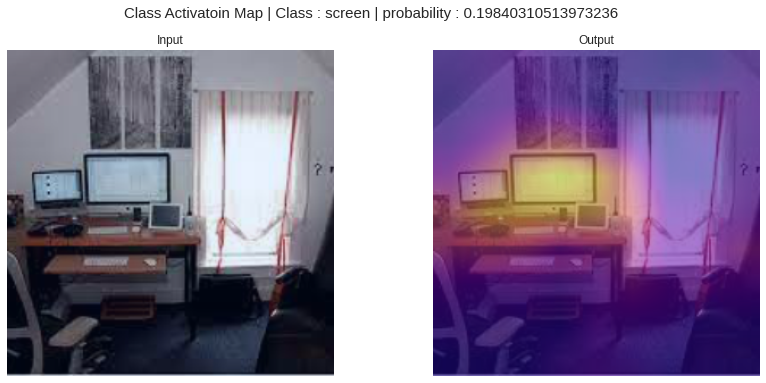

____________________________________________________________________________________________________


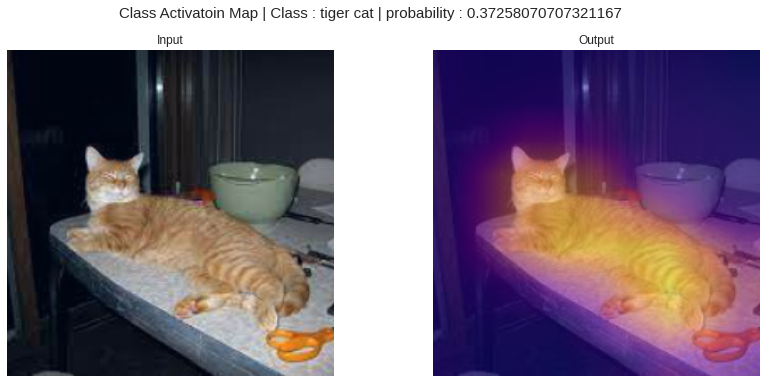

____________________________________________________________________________________________________


In [129]:
Local_Image_Save = []
# We Iter over all 5 images
for filename in FileList:

  # Read and Preprocess Image 
  img = ReadImg(filename)
  T_img = TransforImgCam(img)
  img = np.array(img)
  orig_image = img.copy()

  Extracted_Feature_Maps = []

  # Register Forward hook at last convolution layer
  model.layer4[-1].register_forward_hook(Layer4_hook)
  
  # Get All weights
  params = list(model.parameters())
  # Filter GAP Weights at last second layer
  weight_softmax = np.squeeze(params[-2].data.numpy())

  # Forward pass
  outputs = model(T_img)

  # Find class probabilites 
  probs = torch.nn.functional.softmax(outputs,-1)

  # Find Class with higest probability   
  prob, ind = topk(probs, 1)[0].item(),  topk(probs, 1)[1].item()

  # Get Class_Activatoin_Map
  CAMs = Get_Class_Activatoin_Map(Extracted_Feature_Maps[0], weight_softmax, ind)

  # Normalizing The Image
  T_img.requires_grad = False
  T_img = (T_img - T_img.min()) / (T_img.max() - T_img.min())
  T_img = T_img * 255
  T_img = np.transpose(T_img[0], (1, 2, 0)).numpy()

  # Get Class_Activatoin_Map merged with input image
  h, w, _ = T_img.shape
  Cam_img = Get_Merged_Cam(CAMs, w, h, T_img, ind)

  # Show Image
  Title = "Class Activatoin Map | Class : "+ str(categories[ind])+" | probability : "+str(prob)
  
  T_img = (T_img - T_img.min()) / (T_img.max() - T_img.min())

  # Showing Image
  ShowImage(T_img, Cam_img, title = Title,Iw = 14,Ih = 6)

  # Saving Images to Show in end grid
  Local_Image_Save.append(Cam_img)
  print("_"*100)

Golbal_Image_Save.append(Local_Image_Save)


## (d) Guided Grad-CAM (6)


In [130]:
# Loading A model again for Guided_Grad_Cam
model_GradCam = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
model_GradCam.eval()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [131]:
Extracted_forward_Feature_Maps = []
Extracted_backward_Gradients = []

def Layer4_forward_hook(module, input, output):
  """
    This function is used to get convolutions at last layer and store them into list 
  """
  Extracted_forward_Feature_Maps.append(output)

def Layer4_Backward_hook(module, input, output):
  """
  This function is used to get 
  """
  Extracted_backward_Gradients.append(output[0])


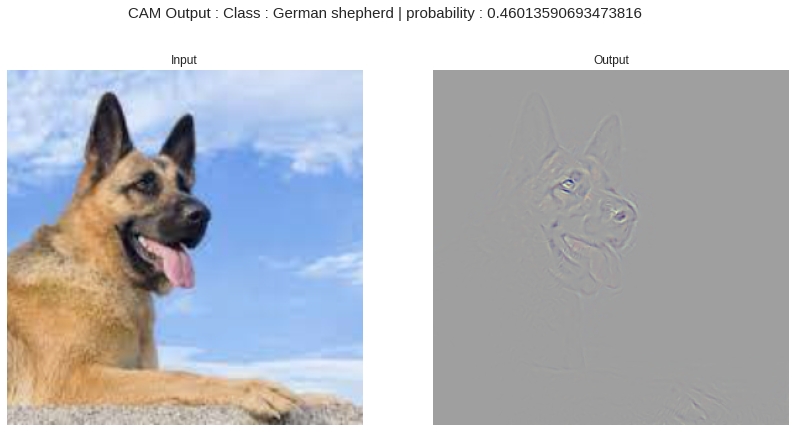

____________________________________________________________________________________________________


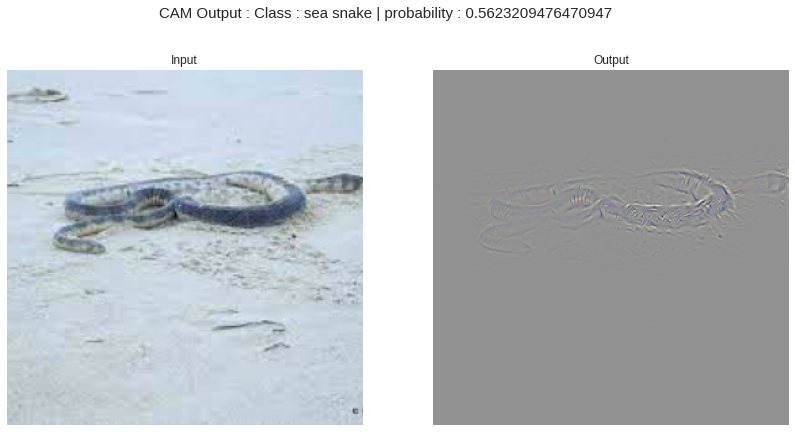

____________________________________________________________________________________________________


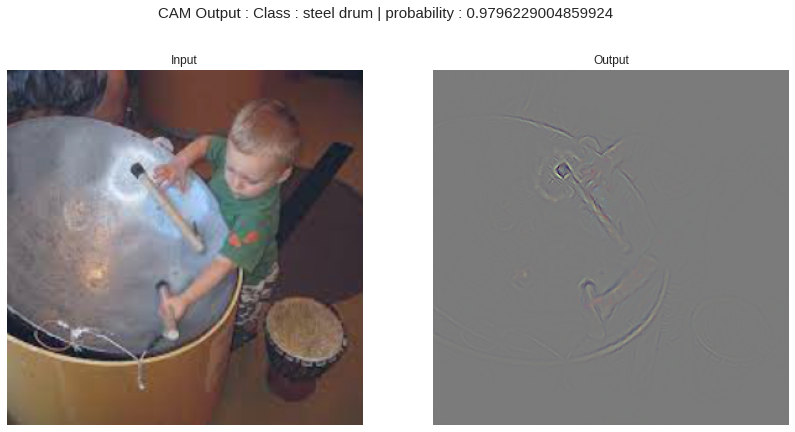

____________________________________________________________________________________________________


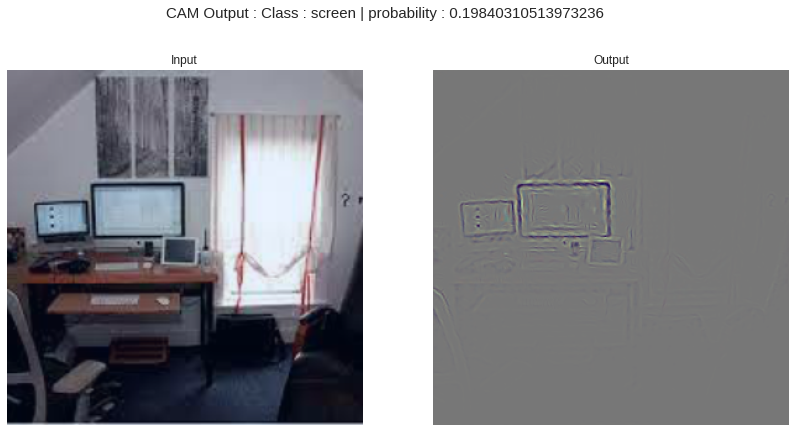

____________________________________________________________________________________________________


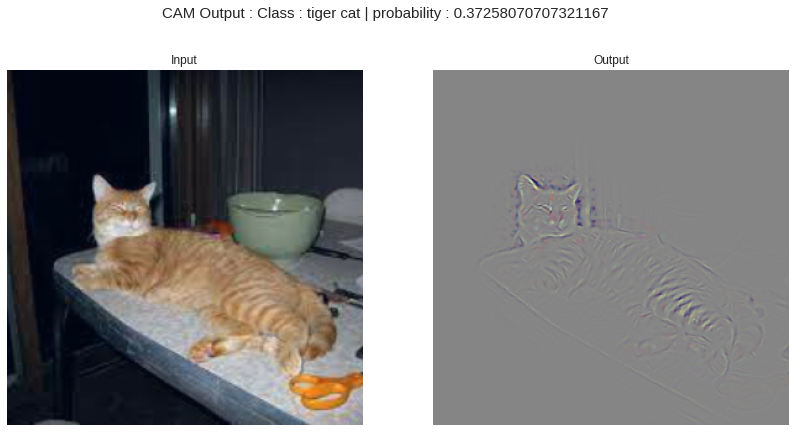

____________________________________________________________________________________________________


In [132]:
Local_Image_Save = []
# We Iter over all 5 images
for ind,filename in enumerate(FileList):

  # Read and Preprocess Image 
  img = ReadImg(filename)
  T_img = TransforImgCam(img)
  img = np.array(img)
  orig_image = img.copy()
  h, w, _ = img.shape

  # To save back prop gradients and forward pass feature maps
  Extracted_forward_Feature_Maps.clear()# = []
  Extracted_backward_Gradients.clear() #= []

  # Register Forward hook and backward hook at last convolution layer
  model_GradCam.layer4[-1].register_forward_hook(Layer4_forward_hook)
  model_GradCam.layer4[-1].register_backward_hook(Layer4_Backward_hook)
  # also Register backward hook for relu at last convolution layer for guided back prop
  for i, module in enumerate(model_GradCam.modules()):
      if isinstance(module, torch.nn.ReLU):
          module.register_backward_hook(Layer4_Relu_hook)

  # Enabling Grads
  T_img.requires_grad = True

  # Forward pass
  outputs = model_GradCam(T_img)

  # Find class probabilites 
  probs = torch.nn.functional.softmax(outputs,-1)

  # Find Class with higest probability   
  prob, index = topk(probs, 1)[0].item(),  topk(probs, 1)[1].item()

  # Setting previous grads to zero 
  model_GradCam.zero_grad()

  # Backward pass respect to predicted class
  outputs[0,torch.argmax(outputs).item()].backward()

  # Extracting data from hook lists
  GradCam_Backward_Grads = Extracted_backward_Gradients[ind].squeeze()
  GradCam_Extracted_Feature_Maps  = Extracted_forward_Feature_Maps[ind].squeeze()

  # Flatterning the feature maps so we can get mean afterwards
  Flattern_Feature_maps = GradCam_Backward_Grads.reshape([GradCam_Backward_Grads.shape[0],-1])
  # Get the mean value of the gradients of every featuremap
  Weights=torch.mean(Flattern_Feature_maps,axis=1)

  # Initializing GradCam mat
  GradCam = torch.zeros(GradCam_Backward_Grads.shape[1:])

  # Aggregating weighted avg
  for i,w in enumerate(Weights):
    GradCam += torch.mul(w,torch.tensor(GradCam_Extracted_Feature_Maps[i]))

  # Applying relu
  GradCam=(GradCam>0)*GradCam

  # Rescaling to orignal res
  GradCam = GradCam.numpy()
  GradCam = cv2.resize(GradCam,(288,288))

  # Normalizing
  GradCam=GradCam/GradCam.max()*255

  # Initializing Guided Grad CAM matrix
  GuidedGradImage = torch.zeros(3,GradCam.shape[0],GradCam.shape[1])

  # Iter over all 3 channel
  for i in range(3):
    # Element vise muliplication of guided backprop and our GradCam
    GuidedGradImage[i] = torch.mul(torch.tensor(GradCam),T_img.grad[0][i])

  # Simple Normalizing 
  GuidedGradImage = (GuidedGradImage - GuidedGradImage.min()) / (GuidedGradImage.max() - GuidedGradImage.min())

  T_img.requires_grad = False
  T_img = (T_img - T_img.min()) / (T_img.max() - T_img.min())
  T_img = np.transpose(T_img[0], (1, 2, 0))

  # Show Image
  Title = "CAM Output : Class : "+ str(categories[index])+" | probability : "+str(prob)
  ShowImage(T_img, GuidedGradImage.permute(1,2,0), title = Title,Iw = 14,Ih = 7)

  # Saving Images to Show in end grid
  Local_Image_Save.append(GuidedGradImage.permute(1,2,0))
  print("_"*100)
Golbal_Image_Save.append(Local_Image_Save)


## Clear visualization of these results for the chosen 5 images carries 5 marks.

In [133]:
def ShowAllImage(ImageList,CLR_BAR = True,gray = False,title="",Label1 = "Input Image",Label2 = "Output Image",Iw = 25,Ih = 5):
  """
  This is just a simple function to Show All Images Side by side using MatplotLib.
  """

  img1,img2,img3,img4,img5 = ImageList
  fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5,figsize=(Iw,Ih))
  fig.suptitle(title,fontsize = 15)

  ax1.imshow(img1)
  ax2.imshow(img2)
  ax3.imshow(img3)
  ax4.imshow(img4)
  ax5.imshow(img5)

  ax1.grid()
  ax2.grid()
  ax3.grid()
  ax4.grid()
  ax5.grid()
  

  # Disabling Axis just cuz' not needed 
  ax1.axes.get_xaxis().set_visible(False)
  ax1.axes.get_yaxis().set_visible(False)
  ax2.axes.get_xaxis().set_visible(False)
  ax2.axes.get_yaxis().set_visible(False)
  ax3.axes.get_xaxis().set_visible(False)
  ax3.axes.get_yaxis().set_visible(False)
  ax4.axes.get_xaxis().set_visible(False)
  ax4.axes.get_yaxis().set_visible(False)
  ax5.axes.get_xaxis().set_visible(False)
  ax5.axes.get_yaxis().set_visible(False)    

  # plt.grid()
  plt.show()


           Input Image                        Vanila BackProp                        Guided BackProp                           CAM                           Guided Grad-Cam


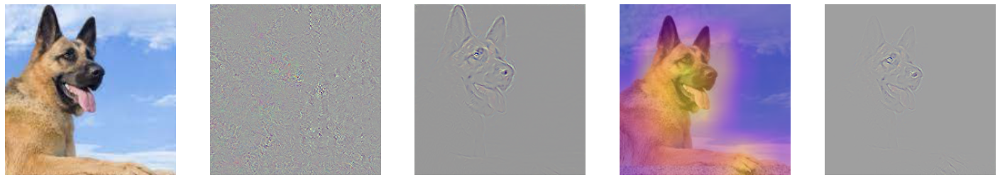

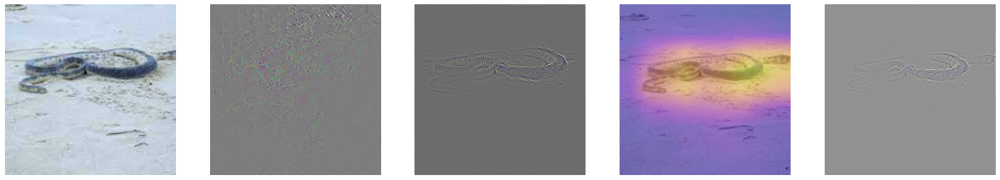

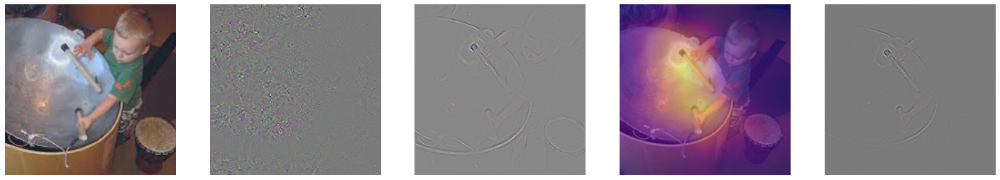

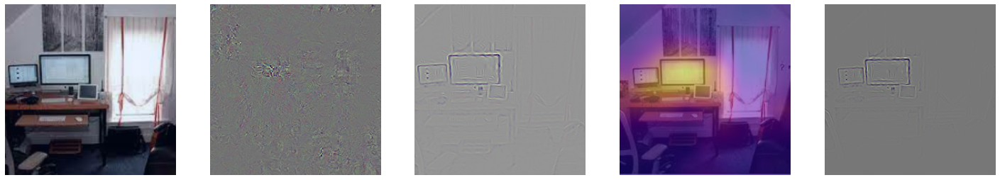

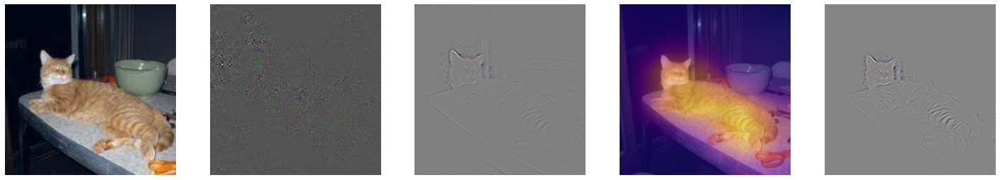

In [134]:
Golbal_Image_Save = np.asarray(Golbal_Image_Save)
print(" "*10,"Input Image"," "*22,"Vanila BackProp"," "*22,"Guided BackProp"," "*25,"CAM"," "*25,"Guided Grad-Cam")
for i in range(len(Golbal_Image_Save)):
  ShowAllImage(Golbal_Image_Save[:,i])



# QUE 2


Implement the following update rules to find the minimum for f(x, y) = 10x
2 + y
2
. You may
consider a random starting point and visualize the convergence (within the region covered by
points (-2, -2) and (2, 2) using a GIF) path taken by different update rules for a fixed (say, 50)
iterations. You are advised to tryout multiple meaning values for the hyper-parameters involved.

* (a) Vanilla SGD (2)

* (b) SGD with momentum (3)

* (c) Nesterov Momentum (3)

* (d) AdaGrad (3)

* (e) RMSProp (4)

* Clear convergence visualization using a GIF image carries 5 marks.

## Answer

All The GIF has been Stored here incase gif results are not visible in colab file.

https://drive.google.com/drive/folders/1Q4flF3ghMGp6D9isieObNU29PfZqgNnC?usp=share_link

In [135]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os
from IPython.display import Image as IpImage
plt.style.use('seaborn')

In [136]:
def dX(x, y):
    return np.array([20*x, 2*y])
    # 10 * x**2 + y**2

In [137]:
# Define Perameters to be used
Max_Iter        = 100
lr              = 0.028
gamma           = 0.95
beta            = 0.95
epsilon         = 1e-8
StartLoc        = np.array([2, 2])

In [138]:
def SaveGif_SingleData(Data1,path,label):
  Img_list = []

  for i,D in enumerate(Data1):
    fig, ax = plt.subplots()
    fig.suptitle(" SGD : "+str(label) + "  |  Iter : "+str(i),fontsize = 15)
    ax.set_xlim([-3, 3])
    ax.set_ylim([-3, 3])
    ax.set_xlabel('x')
    ax.set_ylabel('y')

    ax.plot(Data1[:i,1],Data1[:i,0],'-o',label = label)

    ax.scatter([0],[0],c='g',label = "Minimum")

    ax.legend(loc='upper left')

    filename = f'{i}.png'
    Img_list.append(filename)
    fig.savefig(filename)
    plt.close()

  with imageio.get_writer(path, mode='I') as writer:
      for filename in Img_list:
          image = imageio.imread(filename)
          writer.append_data(image)

  for filename in set(Img_list):
      os.remove(filename)

In [139]:
def SaveGif_All(Data1,Data2,Data3,Data4,Data5,label1,label2,label3,label4,label5,path):
  Img_list = []

  for i,D in enumerate(Data1):
    fig, ax = plt.subplots()
    fig.suptitle(" All SGDs  |  Iter : "+str(i),fontsize = 15)
    ax.set_xlim([-3, 3])
    ax.set_ylim([-3, 3])
    ax.set_xlabel('x')
    ax.set_ylabel('y')

    ax.plot(Data1[:i,1],Data1[:i,0],'-o',label = label1)
    ax.plot(Data2[:i,1],Data2[:i,0],'-o',label = label2)
    ax.plot(Data3[:i,1],Data3[:i,0],'-o',label = label3)
    ax.plot(Data4[:i,1],Data4[:i,0],'-o',label = label4)
    ax.plot(Data5[:i,1],Data5[:i,0],'-o',label = label5)

    ax.scatter([0],[0],c='g',label = "Minimum")

    ax.legend(loc='upper left')
    
    filename = f'{i}.png'
    Img_list.append(filename)
    fig.savefig(filename)
    plt.close()

  with imageio.get_writer(path, mode='I') as writer:
      for filename in Img_list:
          image = imageio.imread(filename)
          writer.append_data(image)

  for filename in set(Img_list):
      os.remove(filename)
  

### All The Function Have implemented from standard equations as mentioned below.
* Refernce : Mostly YouTube Mitesh Khapra Dl Course

---

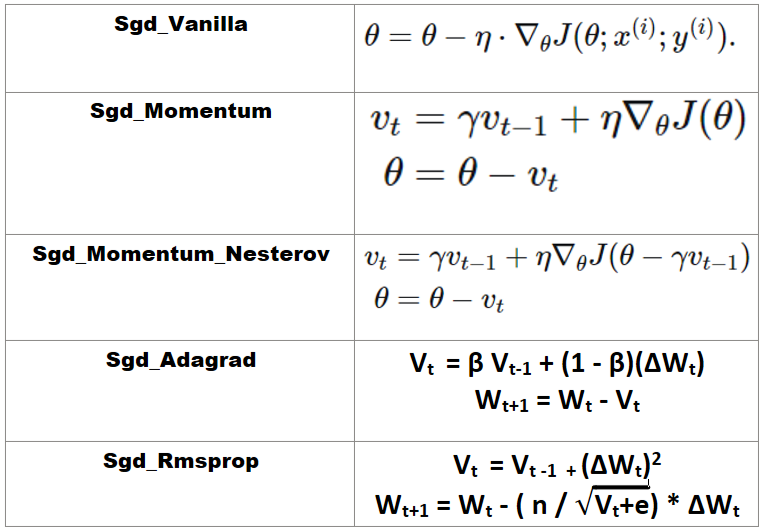

In [140]:

# Vanilla SGD
def Sgd_Vanilla(X, Max_Iter, lr):
  DataToPlot = [X]
  for i in range(Max_Iter):
    X = X - lr * dX(X[0], X[1])
    DataToPlot.append(X)
  return np.array(DataToPlot)

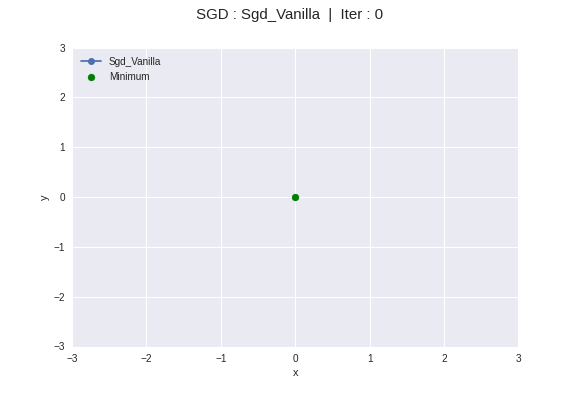

In [141]:
Sgd_Vanilla_Data            = Sgd_Vanilla(StartLoc, Max_Iter, lr)
SaveGif_SingleData(Sgd_Vanilla_Data,"Sgd_Vanilla_Data.gif",'Sgd_Vanilla')
gifPath = '/content/'+'Sgd_Vanilla_Data'+'.gif'
IpImage(open(gifPath,'rb').read())

In [142]:
# SGD with momentum
def Sgd_Momentum(X, Max_Iter, lr, gamma):
  momentum = np.zeros_like(X)
  DataToPlot = [X]
  for i in range(Max_Iter):
    momentum = gamma * momentum + lr * dX(X[0], X[1])
    X = X - momentum
    DataToPlot.append(X)
  return np.array(DataToPlot)



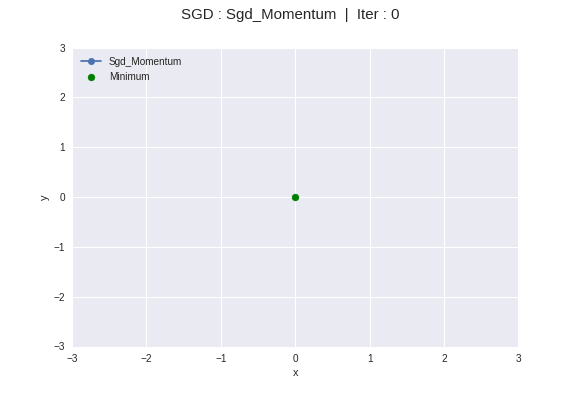

In [143]:
Sgd_Momentum_Data           = Sgd_Momentum(StartLoc, Max_Iter, lr, gamma)
SaveGif_SingleData(Sgd_Momentum_Data,"Sgd_Momentum_Data.gif",'Sgd_Momentum')
gifPath = '/content/'+'Sgd_Momentum_Data'+'.gif'
IpImage(open(gifPath,'rb').read())

In [144]:
# Nesterov Momentum
def Sgd_Momentum_Nesterov(X, Max_Iter, lr, gamma):
  momentum = np.zeros_like(X)
  DataToPlot = [X]
  for i in range(Max_Iter):
    momentum = gamma * momentum + lr * dX( X[0] - gamma * momentum[0], X[1] - gamma * momentum[1] )
    X = X - momentum
    DataToPlot.append(X)
  return np.array(DataToPlot)



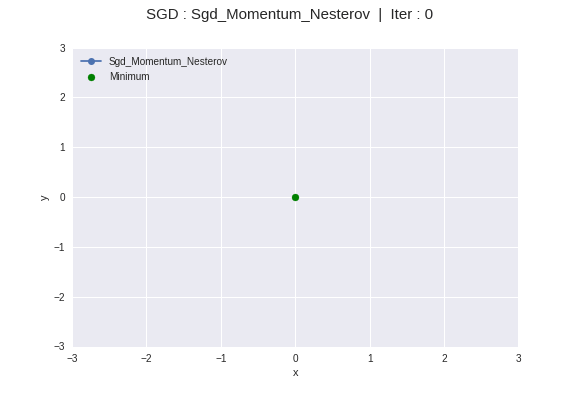

In [145]:
Sgd_Momentum_Nesterov_Data  = Sgd_Momentum_Nesterov(StartLoc, Max_Iter, lr, gamma)
SaveGif_SingleData(Sgd_Momentum_Nesterov_Data,"Sgd_Momentum_Nesterov_Data.gif",'Sgd_Momentum_Nesterov')
gifPath = '/content/'+'Sgd_Momentum_Nesterov_Data'+'.gif'
IpImage(open(gifPath,'rb').read())

In [146]:
# AdaGrad
def Sgd_Adagrad(X, Max_Iter, lr, epsilon):
  momentum = np.zeros_like(X) 
  DataToPlot = [X]
  for i in range(Max_Iter):
    derX = dX(X[0], X[1])
    momentum = momentum + ((derX)**2)
    X = X - (lr * derX / (np.sqrt(momentum + epsilon)))
    DataToPlot.append(X)
  return np.array(DataToPlot)



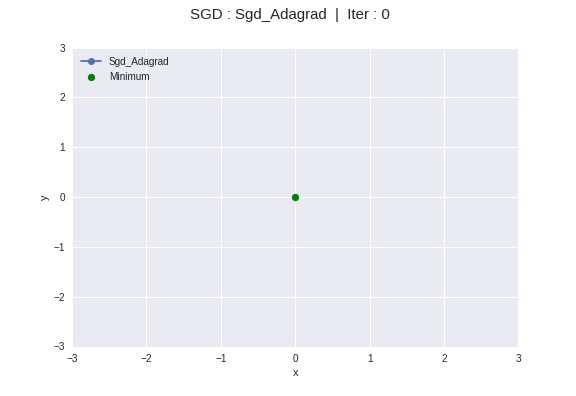

In [147]:
Sgd_Adagrad_Data            = Sgd_Adagrad(StartLoc, Max_Iter, lr, epsilon)
SaveGif_SingleData(Sgd_Adagrad_Data,"Sgd_Adagrad_Data.gif",'Sgd_Adagrad')
gifPath = '/content/'+'Sgd_Adagrad_Data'+'.gif'
IpImage(open(gifPath,'rb').read())

In [148]:
# RMSProp
def Sgd_Rmsprop(X, Max_Iter, lr, beta, epsilon):
  moment = np.zeros_like(X)
  DataToPlot = [X]
  for i in range(Max_Iter):
    derX = dX(X[0], X[1])
    moment = beta * moment + (1 - beta) * derX**2
    X = X - lr * derX / (np.sqrt(moment) + epsilon)
    DataToPlot.append(X)
  return np.array(DataToPlot)

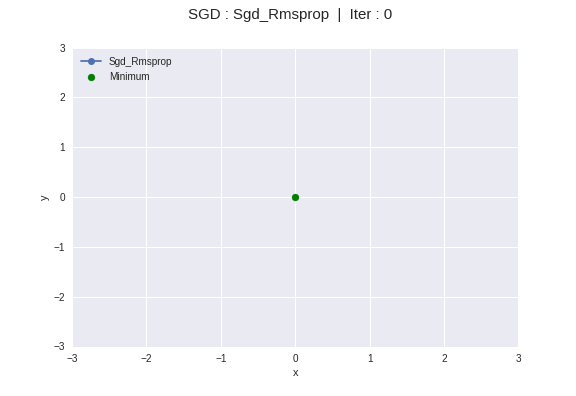

In [149]:
Sgd_Rmsprop_Data            = Sgd_Rmsprop(StartLoc, Max_Iter, lr, beta, epsilon)
SaveGif_SingleData(Sgd_Rmsprop_Data,"Sgd_Rmsprop_Data.gif",'Sgd_Rmsprop')
gifPath = '/content/'+'Sgd_Rmsprop_Data'+'.gif'
IpImage(open(gifPath,'rb').read())

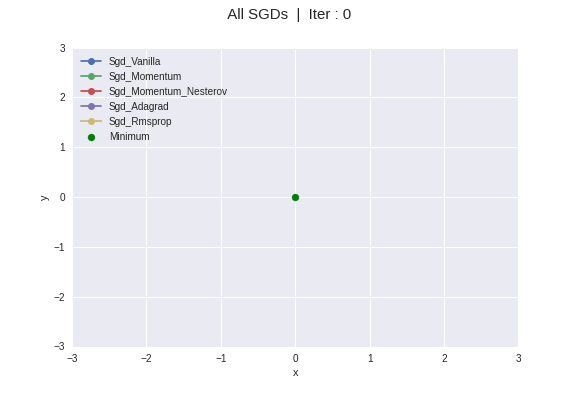

In [150]:
SaveGif_All(Sgd_Vanilla_Data,Sgd_Momentum_Data,Sgd_Momentum_Nesterov_Data,Sgd_Adagrad_Data,Sgd_Rmsprop_Data,"Sgd_Vanilla","Sgd_Momentum","Sgd_Momentum_Nesterov","Sgd_Adagrad","Sgd_Rmsprop","Final_GIF.gif")
filename = 'Final_GIF'
gifPath = '/content/'+filename+'.gif'
IpImage(open(gifPath,'rb').read())

# End
* Note: Please do Run All only because there might be overlapping variable which can show error or incorrect output.
---

<center><h1> Thank You!